In [2]:
import numpy as np
import pandas as pd
from ydata_profiling import ProfileReport

df  = pd.read_csv('datasets/WPP2022_Demographic_Indicators_Medium.csv',  sep=",",low_memory=False)

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 43472 entries, 0 to 43471
Data columns (total 67 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   SortOrder               43472 non-null  int64  
 1   LocID                   43472 non-null  int64  
 2   Notes                   11552 non-null  object 
 3   ISO3_code               36024 non-null  object 
 4   ISO2_code               35872 non-null  object 
 5   SDMX_code               42864 non-null  float64
 6   LocTypeID               43472 non-null  int64  
 7   LocTypeName             43472 non-null  object 
 8   ParentID                43472 non-null  int64  
 9   Location                43472 non-null  object 
 10  VarID                   43472 non-null  int64  
 11  Variant                 43472 non-null  object 
 12  Time                    43472 non-null  int64  
 13  TPopulation1Jan         43472 non-null  float64
 14  TPopulation1July        43186 non-null

In [3]:
#checking the quality of the data 
print(" \nCount total NaN at each column in a DataFrame : \n\n",
      df.isnull().sum())


 
Count total NaN at each column in a DataFrame : 

 SortOrder            0
LocID                0
Notes            31920
ISO3_code         7448
ISO2_code         7600
                 ...  
Q1560              286
Q1560Male          286
Q1560Female        286
NetMigrations      286
CNMR               286
Length: 67, dtype: int64


In [4]:
#Cleaning the dataset 
#The study needs only countries, we ommit regions by deleting them
withNulls =df[ (df['ISO3_code'].isnull() )  ].index
df.drop(withNulls  , inplace=True)

#The country only needs proyections and data up to 2023
estimationsGreaterCurrent = df[ (df['Time'] > 2023 )  ].index
df.drop(estimationsGreaterCurrent  , inplace=True)

#columns with blank spaces
df['DoublingTime'] = df['DoublingTime'].fillna(0)






In [5]:
print(" \nCount total NaN at each column in a DataFrame : \n\n",
      df.isnull().sum())

 
Count total NaN at each column in a DataFrame : 

 SortOrder            0
LocID                0
Notes            12876
ISO3_code            0
ISO2_code           74
                 ...  
Q1560                0
Q1560Male            0
Q1560Female          0
NetMigrations        0
CNMR                 0
Length: 67, dtype: int64


In [6]:
#any na values - only categorical values that are not important for the study
#iso code 2
blank_columns = df.columns[df.isna().any()]
print( blank_columns )


Index(['Notes', 'ISO2_code'], dtype='object')


In [7]:
## PANDAS PROFILING - this library was not able to manage Big Data 

profile = ProfileReport(df, title="Profiling Report")

#profile.to_widgets()

#profile.to_notebook_iframe()    
   
# profile.to_file("population.html")    #

In [8]:
df.head()

,SortOrder,LocID,Notes,ISO3_code,ISO2_code,SDMX_code,LocTypeID,LocTypeName,ParentID,Location,...,Q0060Male,Q0060Female,Q1550,Q1550Male,Q1550Female,Q1560,Q1560Male,Q1560Female,NetMigrations,CNMR
3648,29,108,NaN,BDI,BI,108.0,4,Country/Area,910,Burundi,...,641.8547,595.1510,290.7911,308.1964,274.8946,423.9146,452.6005,397.8913,-13.343,-5.893
3649,29,108,NaN,BDI,BI,108.0,4,Country/Area,910,Burundi,...,640.8312,589.4012,288.3539,307.9939,270.3494,420.8717,452.3522,392.1761,-13.217,-5.721
3650,29,108,NaN,BDI,BI,108.0,4,Country/Area,910,Burundi,...,638.2902,587.9175,288.0273,307.0741,270.5827,420.4448,451.2164,392.4644,-13.715,-5.815
3651,29,108,NaN,BDI,BI,108.0,4,Country/Area,910,Burundi,...,634.7139,584.4393,286.2351,305.3711,268.7026,418.1934,449.0344,390.1690,-14.962,-6.216
3652,29,108,NaN,BDI,BI,108.0,4,Country/Area,910,Burundi,...,631.5888,580.1806,284.1157,303.6124,266.2347,415.5703,446.9088,387.0907,-14.599,-5.948


In [ ]:
from pandasgui import show
show(df)

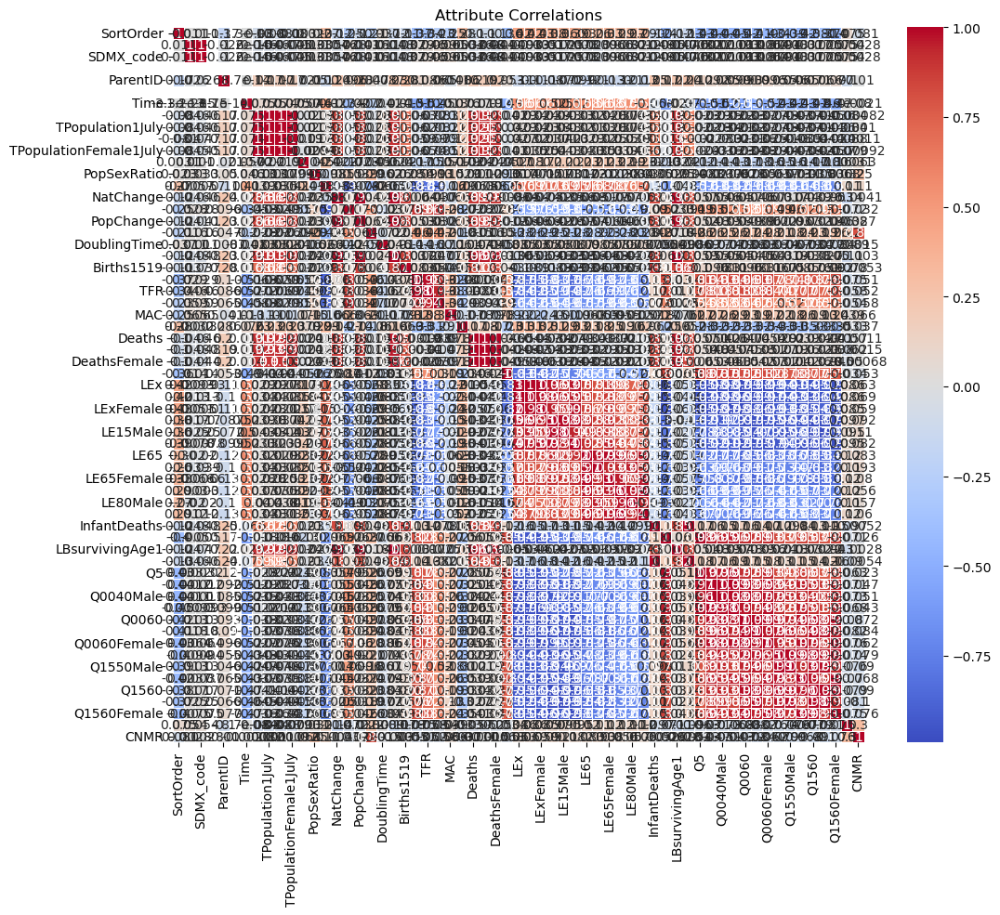

In [9]:
#correlations of the data 
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt


# Calculate the correlation matrix
correlation_matrix = df.corr(numeric_only = True)

# Generate a heatmap to visualize the correlations
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Attribute Correlations')
plt.show()

In [10]:
# Calculate the correlation matrix
correlation_matrix = df.corr(numeric_only = True)

# Iterate over the columns and find the most correlated attribute for each
correlation_percentage = {}
for column in correlation_matrix.columns:
    max_corr = correlation_matrix[column].drop(column).max()
    attribute = correlation_matrix[column].drop(column).idxmax()
    correlation_percentage[column] = f"{max_corr * 100:.2f}% correlated with '{attribute}'"

# Display the correlation percentages
for attribute, correlation in correlation_percentage.items():
    print(f"{attribute}: {correlation}")

SortOrder: 42.83% correlated with 'LExFemale'
LocID: 100.00% correlated with 'SDMX_code'
SDMX_code: 100.00% correlated with 'LocID'
LocTypeID: nan% correlated with 'nan'
ParentID: 27.79% correlated with 'Births1519'
VarID: nan% correlated with 'nan'
Time: 57.98% correlated with 'LE65Female'
TPopulation1Jan: 100.00% correlated with 'TPopulation1July'
TPopulation1July: 100.00% correlated with 'TPopulation1Jan'
TPopulationMale1July: 99.99% correlated with 'TPopulation1July'
TPopulationFemale1July: 99.99% correlated with 'TPopulation1Jan'
PopDensity: 23.58% correlated with 'MedianAgePop'
PopSexRatio: 28.63% correlated with 'PopGrowthRate'
MedianAgePop: 77.67% correlated with 'LE65Female'
NatChange: 99.49% correlated with 'PopChange'
NatChangeRT: 92.77% correlated with 'NRR'
PopChange: 99.49% correlated with 'NatChange'
PopGrowthRate: 81.95% correlated with 'CNMR'
DoublingTime: 9.00% correlated with 'LE65'
Births: 99.95% correlated with 'LBsurvivingAge1'
Births1519: 89.01% correlated with '

In [11]:
cormat = df.corr(numeric_only = True)
round(cormat,2)

,SortOrder,LocID,SDMX_code,LocTypeID,ParentID,VarID,Time,TPopulation1Jan,TPopulation1July,TPopulationMale1July,...,Q0060Male,Q0060Female,Q1550,Q1550Male,Q1550Female,Q1560,Q1560Male,Q1560Female,NetMigrations,CNMR
SortOrder,1.00,0.01,0.01,NaN,-0.17,NaN,-0.00,-0.08,-0.08,-0.08,...,-0.41,-0.43,-0.40,-0.39,-0.42,-0.38,-0.37,-0.40,0.08,-0.08
LocID,0.01,1.00,1.00,NaN,-0.03,NaN,-0.00,-0.05,-0.05,-0.05,...,0.02,0.01,0.01,0.01,0.00,0.02,0.02,0.01,0.05,0.00
SDMX_code,0.01,1.00,1.00,NaN,-0.03,NaN,-0.00,-0.05,-0.05,-0.05,...,0.02,0.01,0.01,0.01,0.00,0.02,0.02,0.01,0.05,0.00
LocTypeID,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ParentID,-0.17,-0.03,-0.03,NaN,1.00,NaN,0.00,0.17,0.17,0.17,...,0.09,0.10,0.05,0.05,0.06,0.07,0.07,0.08,-0.10,-0.01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Q1560,-0.38,0.02,0.02,NaN,0.07,NaN,-0.47,-0.04,-0.04,-0.04,...,0.98,0.96,0.99,0.97,0.96,1.00,0.98,0.98,-0.08,-0.09
Q1560Male,-0.37,0.02,0.02,NaN,0.07,NaN,-0.46,-0.04,-0.04,-0.04,...,0.97,0.91,0.97,0.98,0.91,0.98,1.00,0.93,-0.08,-0.10
Q1560Female,-0.40,0.01,0.01,NaN,0.08,NaN,-0.47,-0.04,-0.04,-0.03,...,0.95,0.98,0.97,0.93,0.99,0.98,0.93,1.00,-0.07,-0.08
NetMigrations,0.08,0.05,0.05,NaN,-0.10,NaN,0.00,-0.08,-0.08,-0.09,...,-0.08,-0.08,-0.07,-0.08,-0.07,-0.08,-0.08,-0.07,1.00,0.30


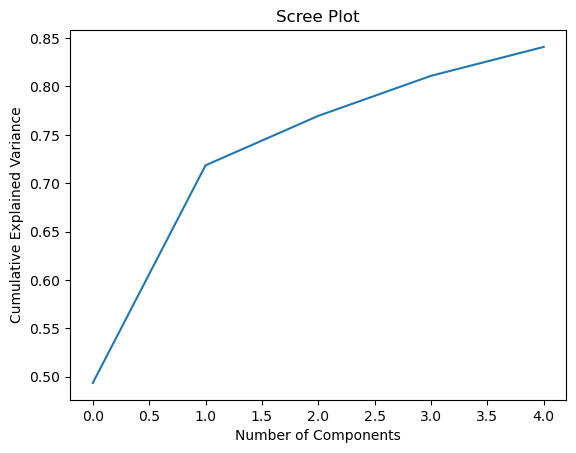

In [12]:
#exploratory data analytics with PCS 

#applying PCA for filtering the 63 columns into a more comprehensive dataset 
import numpy as np
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

pd.set_option('mode.chained_assignment', None)

# Identify the numerical columns in your dataframe
#numerical_columns = df.select_dtypes(include=[np.number]).columns

#including only those attributes that have some significance, related to variable values extracted from the population
numerical_columns= ['Time', 'TPopulation1Jan', 'TPopulation1July', 'TPopulationMale1July',
       'TPopulationFemale1July', 'PopDensity', 'PopSexRatio', 'MedianAgePop',
       'NatChange', 'NatChangeRT', 'PopChange', 'PopGrowthRate',
       'DoublingTime', 'Births', 'Births1519', 'CBR', 'TFR', 'NRR', 'MAC',
       'SRB', 'Deaths', 'DeathsMale', 'DeathsFemale', 'CDR', 'LEx', 'LExMale',
       'LExFemale', 'LE15', 'LE15Male', 'LE15Female', 'LE65', 'LE65Male',
       'LE65Female', 'LE80', 'LE80Male', 'LE80Female', 'InfantDeaths', 'IMR',
       'LBsurvivingAge1', 'Under5Deaths', 'Q5', 'Q0040', 'Q0040Male',
       'Q0040Female', 'Q0060', 'Q0060Male', 'Q0060Female', 'Q1550',
       'Q1550Male', 'Q1550Female', 'Q1560', 'Q1560Male', 'Q1560Female',
       'NetMigrations', 'CNMR']

# # Extract the numerical columns from the dataframe
numerical_data = df[numerical_columns]

numerical_data.fillna(0, inplace=True)

# Standardize the features by subtracting the mean and scaling to unit variance
scaler = StandardScaler()
data_scaled = scaler.fit_transform(numerical_data)


# Create a PCA object and specify the number of components you want to keep
pca = PCA(n_components=5)  

# Apply PCA to the standardized data
pca_result = pca.fit_transform(data_scaled)


# Get the explained variance ratio
explained_variance_ratio = pca.explained_variance_ratio_

# Plot the scree plot
plt.plot(np.cumsum(explained_variance_ratio))
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Scree Plot')
plt.show()



In [13]:
# Print the explained variance ratio
print("Explained variance ratio:", explained_variance_ratio)

# Print the cumulative explained variance ratio
cumulative_variance_ratio = np.cumsum(explained_variance_ratio)
print("Cumulative explained variance ratio:", cumulative_variance_ratio)

Explained variance ratio: [0.49355104 0.22495854 0.05113787 0.04139478 0.02987267]
Cumulative explained variance ratio: [0.49355104 0.71850958 0.76964745 0.81104223 0.8409149 ]


In [14]:
#These loadings indicate the strength and direction of the relationship between the original 
#attributes and the principal components. By analyzing the loadings, 

loadings = pca.components_

# Create a DataFrame to display the loadings
loadings_df = pd.DataFrame(loadings, columns=numerical_columns)


# Print the loadings for each principal component
for i in range(len(loadings_df)):
    print(f"Loadings for Principal Component {i+1}:")
    print(loadings_df.loc[i])
    print()

Loadings for Principal Component 1:
Time                     -0.109253
TPopulation1Jan          -0.004217
TPopulation1July         -0.004088
TPopulationMale1July     -0.003719
TPopulationFemale1July   -0.004475
PopDensity               -0.037039
PopSexRatio              -0.000687
MedianAgePop             -0.146143
NatChange                 0.015884
NatChangeRT               0.125014
PopChange                 0.014213
PopGrowthRate             0.059736
DoublingTime             -0.018819
Births                    0.014556
Births1519                0.022080
CBR                       0.172016
TFR                       0.166721
NRR                       0.135824
MAC                       0.042302
SRB                      -0.062394
Deaths                    0.011532
DeathsMale                0.011052
DeathsFemale              0.012055
CDR                       0.149671
LEx                      -0.190066
LExMale                  -0.189183
LExFemale                -0.189207
LE15               

In [ ]:
"""
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import SelectKBest, f_regression
from sklearn.impute import SimpleImputer

# Assuming you have your dataset stored in a pandas DataFrame called 'df'
# Assuming 'population' is the independent variable and 'target' is the dependent variable

# Extract the columns to be used for feature selection
columns_for_feature_selection = ['Time', 'TPopulation1Jan', 'TPopulation1July', 'TPopulationMale1July',
       'TPopulationFemale1July', 'PopDensity', 'PopSexRatio', 'MedianAgePop',
       'NatChange', 'NatChangeRT', 'PopChange', 'PopGrowthRate',
       'DoublingTime', 'Births', 'Births1519', 'CBR', 'TFR', 'NRR', 'MAC',
       'SRB', 'Deaths', 'DeathsMale', 'DeathsFemale', 'CDR', 'LEx', 'LExMale',
       'LExFemale', 'LE15', 'LE15Male', 'LE15Female', 'LE65', 'LE65Male',
       'LE65Female', 'LE80', 'LE80Male', 'LE80Female', 'InfantDeaths', 'IMR',
       'LBsurvivingAge1', 'Under5Deaths', 'Q5', 'Q0040', 'Q0040Male',
       'Q0040Female', 'Q0060', 'Q0060Male', 'Q0060Female', 'Q1550',
       'Q1550Male', 'Q1550Female', 'Q1560', 'Q1560Male', 'Q1560Female',
       'NetMigrations', 'CNMR']  # Add other columns as needed

# Extract the selected columns from the dataframe
data_for_feature_selection = df[columns_for_feature_selection]

# Separate the independent variable 'population'
population = data_for_feature_selection['TPopulation1Jan']
data_for_feature_selection = data_for_feature_selection.drop('TPopulation1Jan', axis=1)

# Replace missing values (NaN) with appropriate values using SimpleImputer
imputer = SimpleImputer(strategy='mean')  # You can choose a different imputation strategy if desired
data_for_feature_selection = imputer.fit_transform(data_for_feature_selection)

# Standardize the features by subtracting the mean and scaling to unit variance
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data_for_feature_selection)

# Create a PCA object
pca = PCA()

# Apply PCA to the standardized data
pca_result = pca.fit_transform(data_scaled)

# Get the principal component loadings
loadings = pca.components_

# Convert loadings to a pandas DataFrame
loadings_df = pd.DataFrame(loadings, columns=columns_for_feature_selection[1:])

# Add the 'population' column to the loadings_df DataFrame
loadings_df['TPopulation1Jan'] = population

# Reshape the target variable if necessary
target_reshaped = target.values.reshape(-1, 1)

# Handle missing values in the target variable if needed
#target_reshaped = imputer.transform(target_reshaped)

# Specify the number of top features to select
k = 5

loadings = ['Time','TPopulation1Jan','TPopulation1July','TPopulationMale1July','TPopulationFemale1July','PopDensity',
            'PopSexRatio','MedianAgePop','NatChange','NatChangeRT','PopChange','PopGrowthRate','DoublingTime','Births',
            'Births1519','CBR','TFR','NRR','MAC','SRB','Deaths','DeathsMale','DeathsFemale','CDR','LEx','LExMale',
            'LExFemale','LE15','LE15Male','LE15Female','LE65','LE65Male','LE65Female','LE80','LE80Male','LE80Female',
            'InfantDeaths','IMR','LBsurvivingAge1','Under5Deaths','Q5','Q0040','Q0040Male','Q0040Female','Q0060',
            'Q0060Male','Q0060Female','Q1550','Q1550Male','Q1550Female','Q1560','Q1560Male','Q1560Female','NetMigrations',
            'CNMR']

# Perform feature selection using SelectKBest with f_regression
selector = SelectKBest(score_func=f_regression, k=k)
selected_features = selector.fit_transform(loadings_df, target_reshaped)

# Get the indices of the selected features
selected_indices = selector.get_support(indices=True)

# Get the names of the selected features
selected_features_names = loadings_df.columns[loadings]

# Print the names of the selected features
print("Selected Features:")
print(selected_features_names)
"""


In [ ]:
"""
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import SelectKBest, f_regression
from sklearn.impute import SimpleImputer

df1 = numeric_df = df.apply(pd.to_numeric, errors='coerce');


# Extract the columns to be used for feature selection
columns_for_feature_selection = ['Time', 'TPopulation1Jan', 'TPopulation1July', 'TPopulationMale1July',
       'TPopulationFemale1July', 'PopDensity', 'PopSexRatio', 'MedianAgePop',
       'NatChange', 'NatChangeRT', 'PopChange', 'PopGrowthRate',
       'DoublingTime', 'Births', 'Births1519', 'CBR', 'TFR', 'NRR', 'MAC',
       'SRB', 'Deaths', 'DeathsMale', 'DeathsFemale', 'CDR', 'LEx', 'LExMale',
       'LExFemale', 'LE15', 'LE15Male', 'LE15Female', 'LE65', 'LE65Male',
       'LE65Female', 'LE80', 'LE80Male', 'LE80Female', 'InfantDeaths', 'IMR',
       'LBsurvivingAge1', 'Under5Deaths', 'Q5', 'Q0040', 'Q0040Male',
       'Q0040Female', 'Q0060', 'Q0060Male', 'Q0060Female', 'Q1550',
       'Q1550Male', 'Q1550Female', 'Q1560', 'Q1560Male', 'Q1560Female',
       'NetMigrations', 'CNMR']  # Add other columns as needed

# Extract the columns to be used for feature selection
columns_for_feature_selection = df.columns.tolist()

# Remove the 'population' column as it is the target variable
columns_for_feature_selection.remove('TPopulation1Jan')

# Extract the selected columns from the dataframe
data_for_feature_selection = df1[columns_for_feature_selection]

# Separate the dependent variable 'population'
target = df1['TPopulation1Jan']

# Replace missing values (NaN) with appropriate values using SimpleImputer
imputer = SimpleImputer(strategy='mean')  # You can choose a different imputation strategy if desired
data_for_feature_selection = imputer.fit_transform(data_for_feature_selection)

# Standardize the features by subtracting the mean and scaling to unit variance
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data_for_feature_selection)

# Create a PCA object
pca = PCA()

# Apply PCA to the standardized data
pca_result = pca.fit_transform(data_scaled)

# Get the principal component loadings
loadings = pca.components_

# Convert loadings to a pandas DataFrame
loadings_df = pd.DataFrame(loadings, columns=columns_for_feature_selection)

# Reshape the target variable if necessary
target_reshaped = target.values.reshape(-1, 1)

# Handle missing values in the target variable if needed
# target_reshaped = imputer.transform(target_reshaped)

# Specify the number of top features to select
k = 5

# Perform feature selection using SelectKBest with f_regression
selector = SelectKBest(score_func=f_regression, k=k)
selected_features = selector.fit_transform(loadings_df, target_reshaped)

# Get the indices of the selected features
selected_indices = selector.get_support(indices=True)

# Get the names of the selected features
selected_features_names = [columns_for_feature_selection[i] for i in selected_indices]

# Print the names of the selected features
print("Selected Features:")
print(selected_features_names)
"""


In [15]:
#applying PCA for filtering the 63 columns into a more comprehensive dataset 
import numpy as np
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

pd.set_option('mode.chained_assignment', None)

# Identify the numerical columns in your dataframe
#numerical_columns = df.select_dtypes(include=[np.number]).columns

#including only those attributes that have some significance, related to variable values extracted from the population
numerical_columns= ['Time', 'TPopulation1Jan', 'TPopulation1July', 'TPopulationMale1July',
       'TPopulationFemale1July', 'PopDensity', 'PopSexRatio', 'MedianAgePop',
       'NatChange', 'NatChangeRT', 'PopChange', 'PopGrowthRate',
       'DoublingTime', 'Births', 'Births1519', 'CBR', 'TFR', 'NRR', 'MAC',
       'SRB', 'Deaths', 'DeathsMale', 'DeathsFemale', 'CDR', 'LEx', 'LExMale',
       'LExFemale', 'LE15', 'LE15Male', 'LE15Female', 'LE65', 'LE65Male',
       'LE65Female', 'LE80', 'LE80Male', 'LE80Female', 'InfantDeaths', 'IMR',
       'LBsurvivingAge1', 'Under5Deaths', 'Q5', 'Q0040', 'Q0040Male',
       'Q0040Female', 'Q0060', 'Q0060Male', 'Q0060Female', 'Q1550',
       'Q1550Male', 'Q1550Female', 'Q1560', 'Q1560Male', 'Q1560Female',
       'NetMigrations', 'CNMR']

# # Extract the numerical columns from the dataframe
numerical_data = df[numerical_columns]

numerical_data.fillna(0, inplace=True)

# Standardize the features by subtracting the mean and scaling to unit variance
scaler = StandardScaler()

# Preprocess the data by scaling the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(numerical_data)

# Create a PCA object and specify the desired number of components
n_components = 5  # Set the number of components you want to retain
pca = PCA(n_components=n_components)

# Fit the PCA model to your scaled data
pca.fit(X_scaled)

# Transform the original dataset to the reduced dimensionality
X_reduced = pca.transform(X_scaled)

df_reduced = pd.DataFrame(X_reduced)

df_reduced.head()


,0,1,2,3,4
0,9.131766,-1.121173,1.257353,-1.393775,0.388360
1,9.018708,-1.111202,1.300453,-1.389834,0.380376
2,8.950029,-1.105919,1.323559,-1.365904,0.390358
3,8.842017,-1.099388,1.309403,-1.337136,0.436979
4,8.727473,-1.093568,1.269797,-1.330193,0.447107


In [17]:
#backwards elimination with python statsmodels.api
import pandas as pd
import statsmodels.api as sm

# Assuming you have your dataset stored in a pandas DataFrame called 'data'
# 'data' should have the shape (17000, 21), with 21 attributes and 17000 records

#including only those attributes that have some significance, related to variable values extracted from the population
numerical_columns= ['Time', 'TPopulation1Jan', 'TPopulation1July', 'TPopulationMale1July',
       'TPopulationFemale1July', 'PopDensity', 'PopSexRatio', 'MedianAgePop',
       'NatChange', 'NatChangeRT', 'PopChange', 'PopGrowthRate',
       'DoublingTime', 'Births', 'Births1519', 'CBR', 'TFR', 'NRR', 'MAC',
       'SRB', 'Deaths', 'DeathsMale', 'DeathsFemale', 'CDR', 'LEx', 'LExMale',
       'LExFemale', 'LE15', 'LE15Male', 'LE15Female', 'LE65', 'LE65Male',
       'LE65Female', 'LE80', 'LE80Male', 'LE80Female', 'InfantDeaths', 'IMR',
       'LBsurvivingAge1', 'Under5Deaths', 'Q5', 'Q0040', 'Q0040Male',
       'Q0040Female', 'Q0060', 'Q0060Male', 'Q0060Female', 'Q1550',
       'Q1550Male', 'Q1550Female', 'Q1560', 'Q1560Male', 'Q1560Female',
       'NetMigrations', 'CNMR']

# # Extract the numerical columns from the dataframe
numerical_data = df[numerical_columns]

# Add a constant column to the DataFrame
data = sm.add_constant(numerical_data)

# Create a list of all attribute names
all_features = data.columns.tolist()

# Set the significance level for removing features (e.g., p-value threshold)
significance_level = 0.05

while len(all_features) > 1:
    # Select the remaining features for the current iteration
    remaining_features = all_features[:]
    
    # Fit the model using statsmodels
    model = sm.OLS(data.iloc[:, 0], data[remaining_features]).fit()
    
    # Get the p-values for each feature
    p_values = model.pvalues.iloc[1:]
    
    # Identify the feature with the highest p-value
    max_p_value = p_values.max()
    max_p_index = p_values.idxmax()
    
    # Check if the highest p-value is above the significance level
    if max_p_value > significance_level:
        # Remove the feature with the highest p-value from the list
        all_features.remove(max_p_index)
    else:
        # If all p-values are below the significance level, stop the loop
        break

# Print the final set of selected features
selected_features = all_features[1:]  # Exclude the constant column
print(selected_features)


['TPopulationFemale1July', 'NatChangeRT', 'CBR', 'LE15Male']


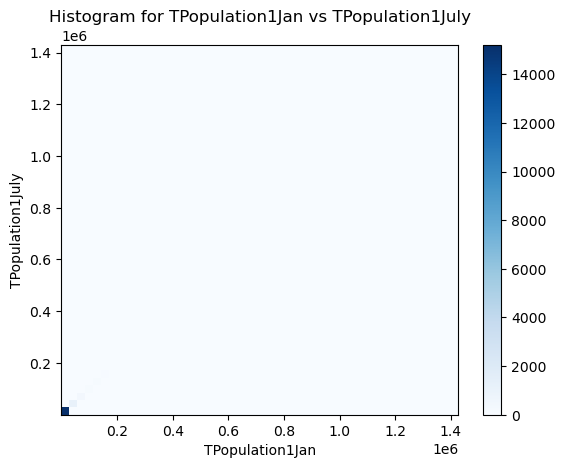

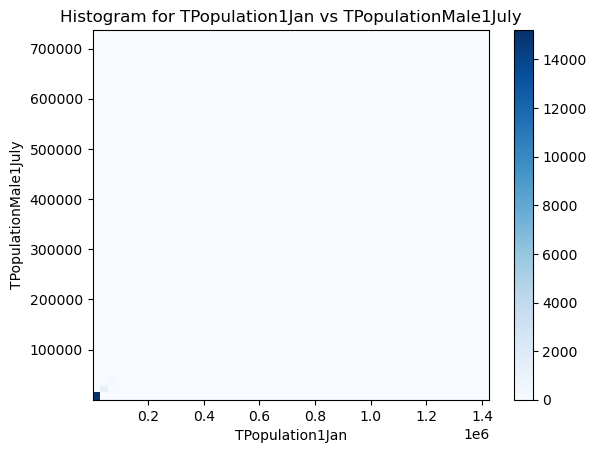

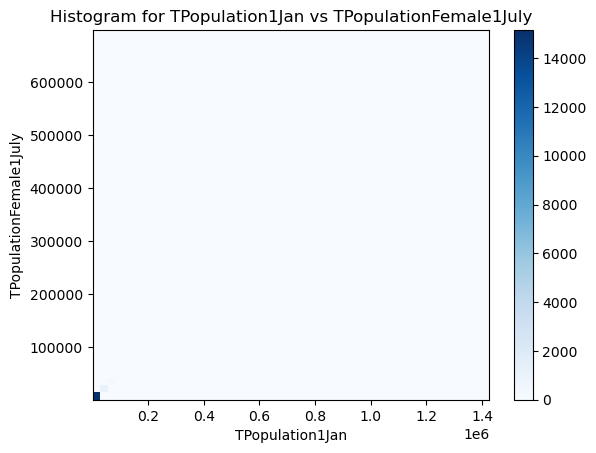

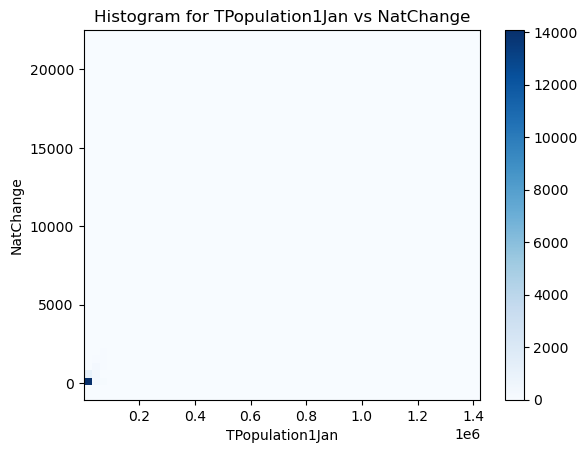

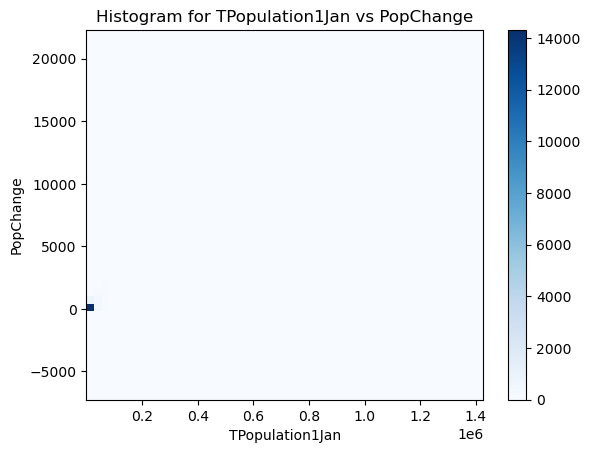

...

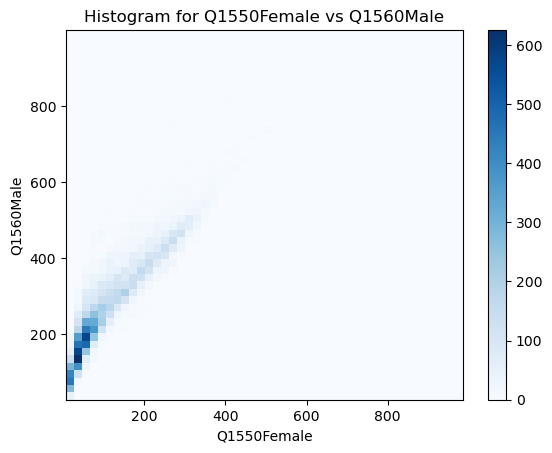

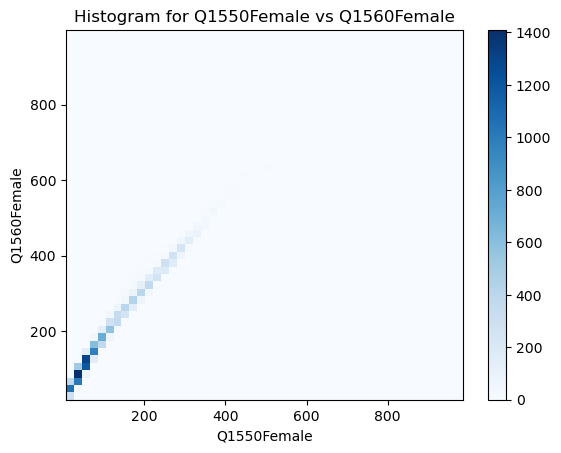

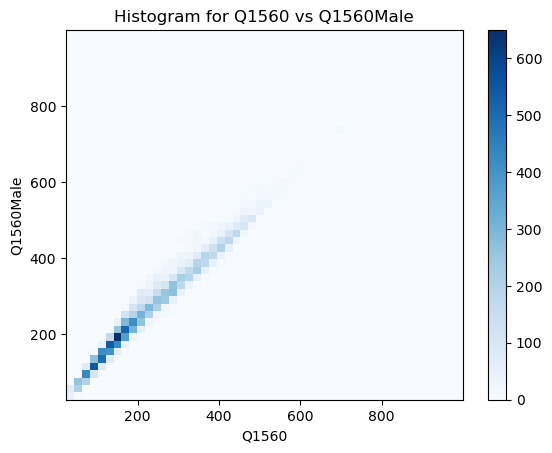

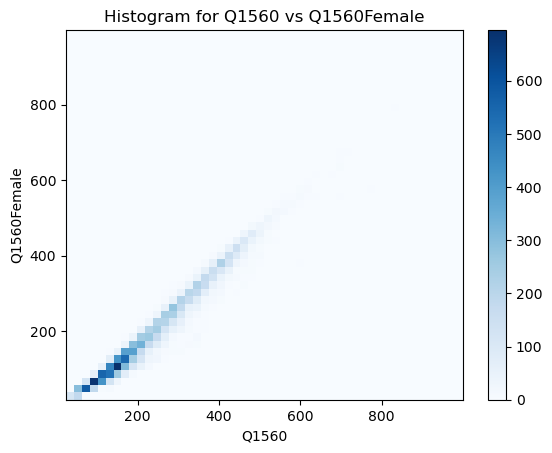

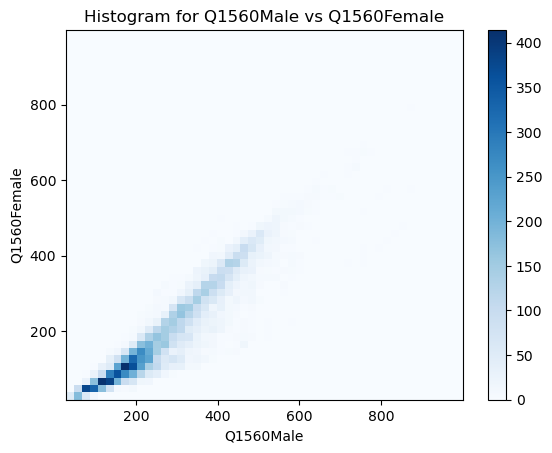

In [18]:
#plotting the most important collinear duplas
import pandas as pd
import matplotlib.pyplot as plt


numerical_columns= ['Time', 'TPopulation1Jan', 'TPopulation1July', 'TPopulationMale1July',
       'TPopulationFemale1July', 'PopDensity', 'PopSexRatio', 'MedianAgePop',
       'NatChange', 'NatChangeRT', 'PopChange', 'PopGrowthRate',
       'DoublingTime', 'Births', 'Births1519', 'CBR', 'TFR', 'NRR', 'MAC',
       'SRB', 'Deaths', 'DeathsMale', 'DeathsFemale', 'CDR', 'LEx', 'LExMale',
       'LExFemale', 'LE15', 'LE15Male', 'LE15Female', 'LE65', 'LE65Male',
       'LE65Female', 'LE80', 'LE80Male', 'LE80Female', 'InfantDeaths', 'IMR',
       'LBsurvivingAge1', 'Under5Deaths', 'Q5', 'Q0040', 'Q0040Male',
       'Q0040Female', 'Q0060', 'Q0060Male', 'Q0060Female', 'Q1550',
       'Q1550Male', 'Q1550Female', 'Q1560', 'Q1560Male', 'Q1560Female',
       'NetMigrations', 'CNMR']

# # Extract the numerical columns from the dataframe
data = df[numerical_columns]


correlation_threshold = 0.8

# Compute the correlation matrix
correlation_matrix = data.corr().abs()

# Find pairs of features with a correlation coefficient above the threshold
collinear_features = []
for i in range(len(correlation_matrix.columns)):
    for j in range(i+1, len(correlation_matrix.columns)):
        if correlation_matrix.iloc[i, j] > correlation_threshold:
            feature_i = correlation_matrix.columns[i]
            feature_j = correlation_matrix.columns[j]
            collinear_features.append((feature_i, feature_j))

# Plot histograms for each pair of collinear features
for feature_i, feature_j in collinear_features:
    plt.figure()
    plt.hist2d(data[feature_i], data[feature_j], bins=50, cmap='Blues')
    plt.xlabel(feature_i)
    plt.ylabel(feature_j)
    plt.colorbar()
    plt.title(f'Histogram for {feature_i} vs {feature_j}')
    plt.show()


In [19]:
#remove collinear features based on the correlation coefficient between features
import pandas as pd
import numpy as np

numerical_columns= ['LocID','Time', 'TPopulation1Jan', 'TPopulation1July', 'TPopulationMale1July',
       'TPopulationFemale1July', 'PopDensity', 'PopSexRatio', 'MedianAgePop',
       'NatChange', 'NatChangeRT', 'PopChange', 'PopGrowthRate',
       'DoublingTime', 'Births', 'Births1519', 'CBR', 'TFR', 'NRR', 'MAC',
       'SRB', 'Deaths', 'DeathsMale', 'DeathsFemale', 'CDR', 'LEx', 'LExMale',
       'LExFemale', 'LE15', 'LE15Male', 'LE15Female', 'LE65', 'LE65Male',
       'LE65Female', 'LE80', 'LE80Male', 'LE80Female', 'InfantDeaths', 'IMR',
       'LBsurvivingAge1', 'Under5Deaths', 'Q5', 'Q0040', 'Q0040Male',
       'Q0040Female', 'Q0060', 'Q0060Male', 'Q0060Female', 'Q1550',
       'Q1550Male', 'Q1550Female', 'Q1560', 'Q1560Male', 'Q1560Female',
       'NetMigrations', 'CNMR']

# # Extract the numerical columns from the dataframe
data = df[numerical_columns]


# Specify the correlation threshold for identifying collinear features
correlation_threshold = 0.8

# Compute the correlation matrix
correlation_matrix = data.corr().abs()

# Create a mask to identify collinear features
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))

# Find pairs of features with a correlation coefficient above the threshold
collinear_features = set()
for i in range(len(correlation_matrix.columns)):
    for j in range(i+1, len(correlation_matrix.columns)):
        if correlation_matrix.iloc[i, j] > correlation_threshold:
            feature_i = correlation_matrix.columns[i]
            feature_j = correlation_matrix.columns[j]
            collinear_features.add(feature_j)
            
            
print( collinear_features )            

# Remove the collinear features from the dataset
data_filtered = data.drop(columns=collinear_features)




{'LE80Female', 'NatChangeRT', 'TPopulation1July', 'Q1560Female', 'Q0060Male', 'LE15Female', 'LExMale', 'TPopulationMale1July', 'Q1550', 'Q0060Female', 'Under5Deaths', 'Deaths', 'Q0040', 'DeathsFemale', 'Births1519', 'TPopulationFemale1July', 'LEx', 'Births', 'LE15', 'LE80', 'NatChange', 'DeathsMale', 'LBsurvivingAge1', 'LE80Male', 'Q1550Male', 'Q1550Female', 'Q1560Male', 'Q0060', 'TFR', 'LExFemale', 'LE65Female', 'CBR', 'NRR', 'CNMR', 'LE65', 'LE65Male', 'PopChange', 'Q0040Male', 'IMR', 'Q1560', 'LE15Male', 'InfantDeaths', 'Q0040Female', 'Q5'}


In [20]:
data_filtered.head()

,LocID,Time,TPopulation1Jan,PopDensity,PopSexRatio,MedianAgePop,PopGrowthRate,DoublingTime,MAC,SRB,CDR,NetMigrations
3648,108,1950,2229.322,86.8637,91.9472,18.3147,2.200,31.5067,30.995,102.5,23.546,-13.343
3649,108,1951,2278.903,88.7571,92.1448,18.0842,2.114,32.7884,30.996,102.5,23.879,-13.217
3650,108,1952,2327.593,90.6179,92.3191,17.8744,2.036,34.0446,31.026,102.5,23.815,-13.715
3651,108,1953,2375.478,92.4508,92.4880,17.6693,1.969,35.2030,31.030,102.5,23.604,-14.962
3652,108,1954,2422.721,94.2874,92.6503,17.4706,1.965,35.2747,31.036,102.5,23.347,-14.599


In [22]:
merged_df = pd.merge(data_filtered, df[['LocID', 'Time', 'Location']], on=['LocID', 'Time'], how='left')


In [24]:
merged_df.head()

,LocID,Time,TPopulation1Jan,PopDensity,PopSexRatio,MedianAgePop,PopGrowthRate,DoublingTime,MAC,SRB,CDR,NetMigrations,Location
0,108,1950,2229.322,86.8637,91.9472,18.3147,2.200,31.5067,30.995,102.5,23.546,-13.343,Burundi
1,108,1951,2278.903,88.7571,92.1448,18.0842,2.114,32.7884,30.996,102.5,23.879,-13.217,Burundi
2,108,1952,2327.593,90.6179,92.3191,17.8744,2.036,34.0446,31.026,102.5,23.815,-13.715,Burundi
3,108,1953,2375.478,92.4508,92.4880,17.6693,1.969,35.2030,31.030,102.5,23.604,-14.962,Burundi
4,108,1954,2422.721,94.2874,92.6503,17.4706,1.965,35.2747,31.036,102.5,23.347,-14.599,Burundi


In [26]:
from pandasgui import show
show( merged_df )

PandasGUI INFO — pandasgui.gui — Opening PandasGUI


In [27]:
# merged_df.to_csv('datasets/population_merged_reduced.csv')